# Module loading and environment setup

There is a known issue with how python and Julia interact. To get the Julia code to run you need to set the number of cores abnd the julia system image BEFORE you add the "Main" package

The order for importing pyJulia is very important, see below

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
from scipy.ndimage import uniform_filter1d

#Order is important!!
#set the number of cores in the julia environment
from multiprocessing import cpu_count
os.environ["JULIA_NUM_THREADS"] = str(cpu_count())
from julia import Julia

#For windows and linux, there is the bug that requires the system image be passed into Julia 
Julia(sysimage="./sys.so")
from julia import Main
#using the julia syntax, you add the BackgroundSubtraction.jl code to the julia Main and can now import the julia functions.  
Main.include('/home/duncan/BackgroundSubtraction.jl/src/BackgroundSubtraction.jl')
from julia.Main import BackgroundSubtraction
mcbl = BackgroundSubtraction.mcbl


def compsort(h5data,cation_index=0):
    """returns the keys ordered based on the cation fraction of cation index
    for a 1D compspread it doesn't matter. for a pseudo ternary or higher, the cation index will
    indicate which cation is being used"""
    keys = list(h5data)
    comps = []
    print(f"using cation {h5data[keys[0]].attrs['cations'][cation_index]}")
    for key in keys:
        comps.append(h5data[key].attrs['fracs'][cation_index][0])
    compkeys = np.array(sorted(zip(comps,keys)))[:,1].tolist()
    compfracs = np.array(sorted(zip(comps,keys)))[:,0].tolist()
    return compkeys, compfracs

## An example on 1D data

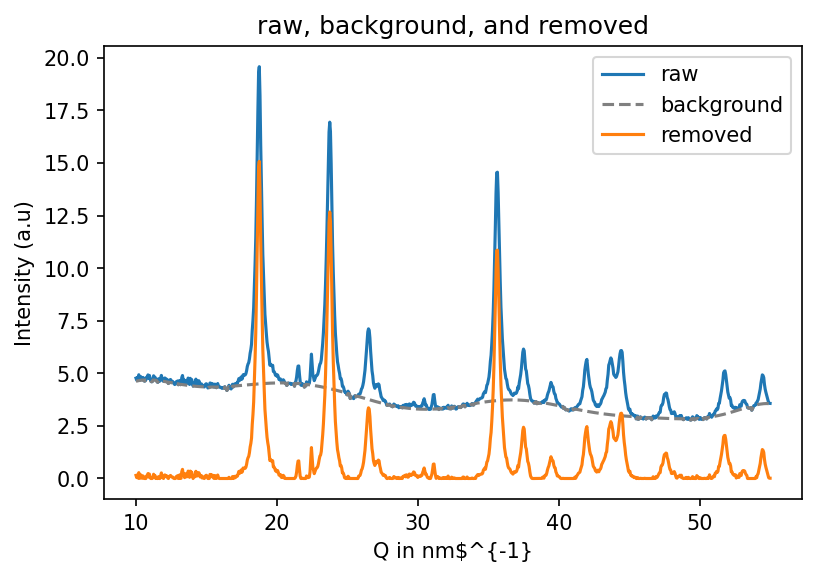

In [125]:
Y = np.load('sample_1D_Data.npy')
X = np.load('sample_x_Data.npy')
#The MCBL code applied to 1D data (i.e. Intensity vs. Q in x-ray diffraction)
# - the 1D data                       type:     (1 x n) float64
# - the x array                       type:     Array(1 x n) float64
# - length scale                      type:     float

Y = Y
X = X.astype('float64')
l_x = 10.                                          # in units of X
bkg = mcbl(Y, X, l_x)

fig,ax = plt.subplots(dpi=150)
ax.plot(X, Y,   label='raw')
ax.plot(X, bkg, c='gray', linestyle='--', label='background')
ax.plot(X, Y-bkg, label='removed')

ax.set(
    xlabel="Q in nm$^{-1}",
    ylabel="Intensity (a.u)",
    title="raw, background, and removed"
)
ax.legend()

## An example on 2D data

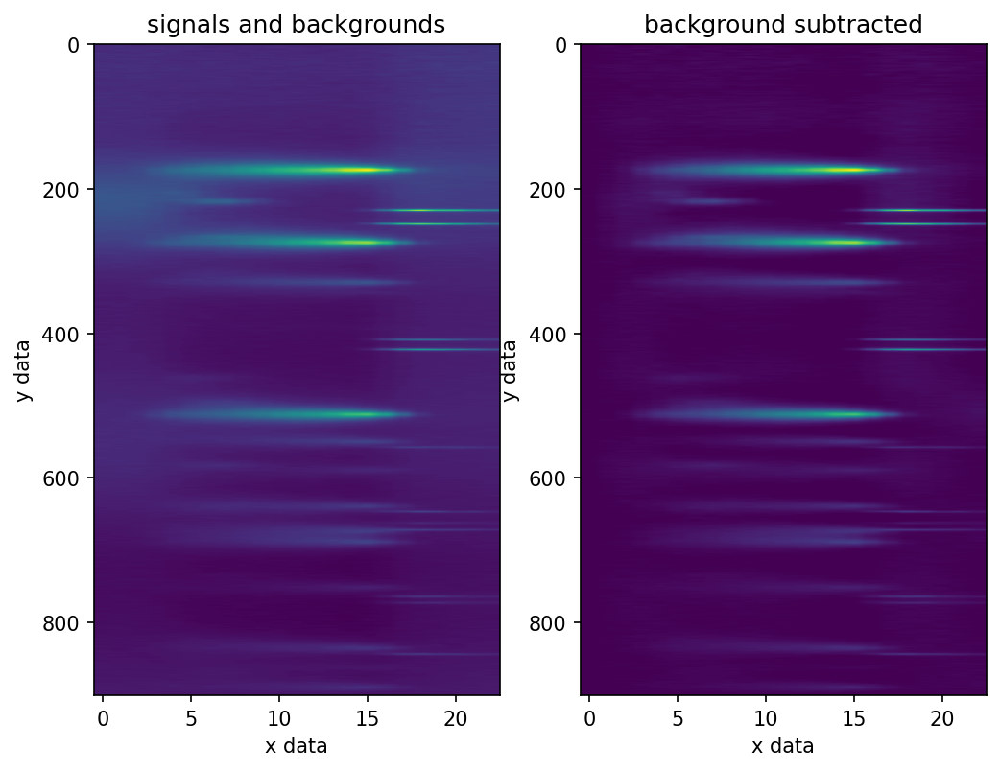

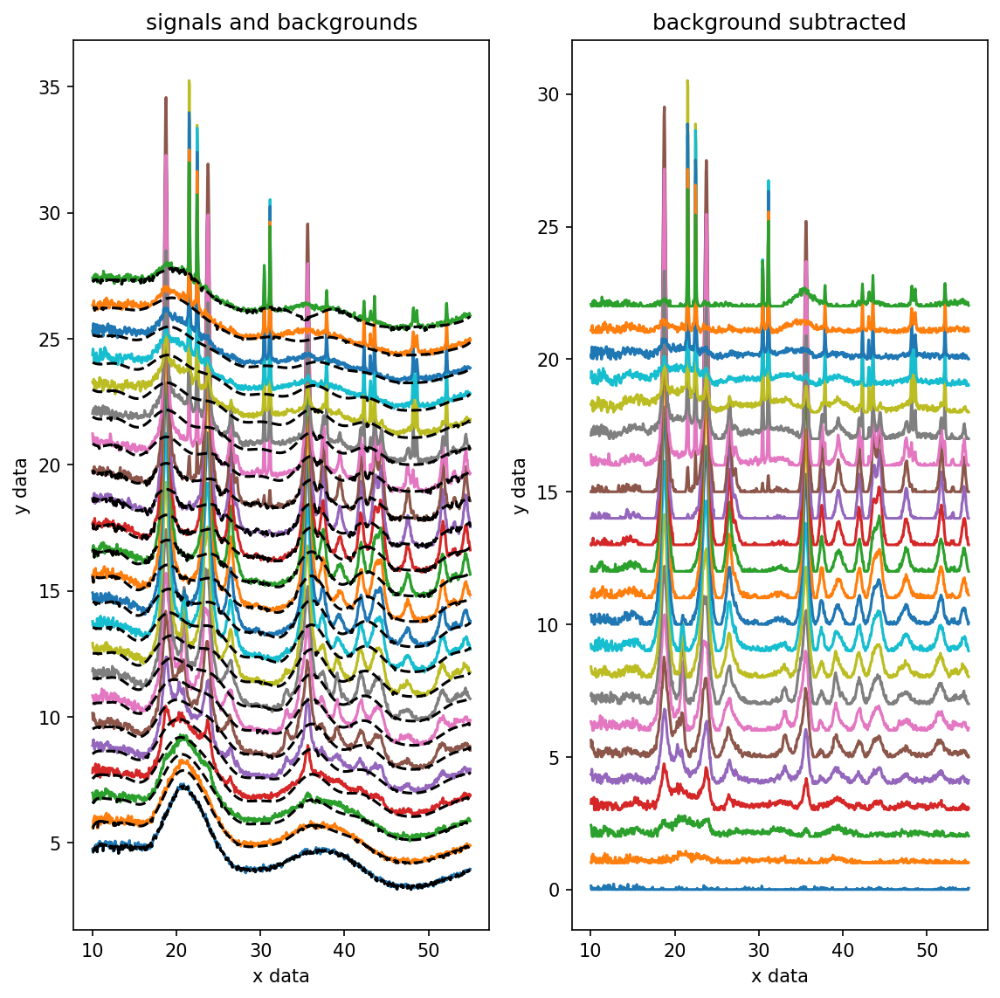

In [26]:
###2D data of Y values and the corresponding X vector
A = np.load('sample_2D_Data.npy')
x = np.load('sample_x_Data.npy')

###The MCBL code applied to 2D data (in this case intensity of x-ray diffraction patterns as a function of position)
#The inputs in order are
# - the 2D data                       type:     (m x n) float64
# - the x array                       type:     vect(1 x n) float64
# - the y array                       type:     vect(1 x m) float64
# - length scale of Y dim 1           type:     float
# - length scale of Y dim 2           type:     float

A = A
x = x.astype('float64')
y = np.linspace(0,1,A.shape[1],dtype='float64')
l_x = 7.                                # in units of x
l_y = 1.                                # in units of y

nIter = 15.
bkg = mcbl(A, x, l_x, y, l_y)



###plotting to show the results
fig,ax = plt.subplots(1,2,dpi=150,figsize=(8,6))
ax[0].imshow(A,aspect='auto')
ax[1].imshow((A-bkg),aspect='auto')
ax[0].set(
    xlabel = "x data",
    ylabel = "y data",
    title = "signals and backgrounds"
    )

ax[1].set(
    xlabel = "x data",
    ylabel = "y data",
    title = "background subtracted"
    )
plt.show()
plt.show()
plt.close()
fig,ax = plt.subplots(1,2,dpi=150,figsize=(9,9))
for idx, y in enumerate(Y.T):
    ax[0].plot(X,y+idx*1)

for idx, b in enumerate(bkg.T):
    ax[0].plot(X,b+idx*1,c='k',linestyle='--')
    
for idx, y in enumerate(Y.T):
    ax[1].plot(X, y - bkg.T[idx] + idx)

ax[0].set(
    xlabel = "x data",
    ylabel = "y data",
    title = "signals and backgrounds"
    )

ax[1].set(
    xlabel = "x data",
    ylabel = "y data",
    title = "background subtracted"
    )
plt.show()

[5.4179544 5.3135514 5.276889  5.373429  5.5265203 5.3274565 5.323185
 5.569721  5.448677  5.385735  5.5247717 5.533414  5.2373576 5.302401
 5.4412446 5.4546027 5.3877387 5.3588524 5.4242554 5.2045016 5.260243
 5.3676434 5.4788303 5.440088  5.2961845 5.473127  5.6894507 5.575183
 5.510486  5.4842186 5.41756   5.537178  5.4255166 5.299508  5.4822164
 5.4881053 5.473532  5.3726406 5.5467243 5.5352545 5.3405766 5.3784575
 5.421803  5.5325336 5.5548754 5.3677874 5.431632  5.4282427 5.4939895
 5.436297  5.3995976 5.222235  5.187297  5.4364486 5.348353  5.292772
 5.285798  5.4741125 5.305763  5.3748083 5.272121  5.283668  5.3402486
 5.520049  5.3381615 5.3621154 5.4127264 5.3637524 5.3094773 5.170039
 5.1711397 5.375427  5.4153876 5.3932066 5.3614335 5.4694843 5.312303
 5.456793  5.4026213 5.3764944 5.5492945 5.4717135 5.4759927 5.531413
 5.5704823 5.5007463 5.36349   5.3001304 5.3526964 5.4388113 5.537684
 5.5167255 5.419798  5.411393  5.354084  5.282702  5.405497  5.3824253
 5.4334264 5.27

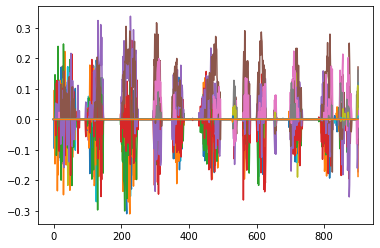

In [21]:
for i in np.arange(len(bkg.T)-1):
    plt.plot(bkg.T[i+1]-bkg.T[i])
print(y)

# 3D example

This cell attempts to use the MCBL over {Q, positions (T profile), composition} 

In [16]:
import h5py as h5
from scipy.interpolate import interp1d
h5data = h5.File("/home/duncan/Documents/Data/60882_LaMnOx_AL/38_60882_LaMnOx_AL_RUN_all_1d.h5",'r')['exp']
alld = []
allQ = []
binsize = 1024
compspread=True
# for key in list(h5data)[::15]:
# #     print(key)
#     tau = int(key.split('_')[1])
#     Tmax = int(key.split('_')[3])
#     comp = np.round(h5data[key].attrs['fracs'][0][0],2)
#     cation = h5data[key].attrs['cations'][0]
#     print(f"τ:    {tau}")
#     print(f"Tmax: {Tmax}")
#     print(f"{cation}:   {comp}")
#     print("")
    
#     amorph = h5data[key]['0']['integrated_1d'][1]
#     Q = h5data[key]['0']['integrated_1d'][0]
    
# fig,ax = plt.subplots()
# ax.plot(Q, amorph)
# plt.show()

In [14]:
Qs_all = []
Is_all = []
taus_all = []
Ts_all = []
AD_qs = []
AD_Is = []
if compspread:
    La_frac_all = []
for idx, key in enumerate(list(h5data)):

    print(idx, key)
    #build the heatmap from the 1D data
    tau = float(key.split('_')[1])
    Tmax = float(key.split('_')[3])
    if compspread:
        La_frac = h5data[key].attrs['fracs'][0][0]
        print(La_frac)

    xmap = []
    for i in sorted(list(h5data[key]),key=int):
        xmap.append(h5data[key][i]['integrated_1d'][1])
    xmap = np.array(xmap).T
    Q = np.array(h5data[key][i]['integrated_1d'][0])
    
    AD_qs.append(Q)
    AD_Is.append(np.average(xmap[:,:15],axis=1))
    Ts_all.append(Tmax)
    taus_all.append(tau)
    La_frac_all.append(La_frac)

lowerbound = np.max([min(Q) for Q in AD_qs])
upperbound = np.min([max(Q) for Q in AD_qs])
print(lowerbound,upperbound)
print(np.min(AD_qs),np.max(AD_qs))

0 tau_1043_T_1313
0.6567196959389487
0.6567196959389487
1 tau_1048_T_909
0.23905256117385043
0.23905256117385043
2 tau_1084_T_1399
0.7511211263767121
0.7511211263767121
3 tau_1089_T_818
0.6095671414026499
0.6095671414026499
4 tau_1099_T_1097
0.7475364719065525
0.7475364719065525
5 tau_1099_T_647
0.8084991578006879
0.8084991578006879
6 tau_1167_T_685
0.215002857805485
0.215002857805485
7 tau_1187_T_780
0.35958865440304383
0.35958865440304383
8 tau_1191_T_978
0.33798028494168675
0.33798028494168675
9 tau_1194_T_1399
0.41351623009010413
0.41351623009010413
10 tau_1200_T_926
0.8189666403075939
0.8189666403075939
11 tau_1207_T_1088
0.48680596809984594
0.48680596809984594
12 tau_1212_T_1391
0.5257356897713129
0.5257356897713129
13 tau_1234_T_912
0.158421736417853
0.158421736417853
14 tau_1256_T_1023
0.6481017640228407
0.6481017640228407
15 tau_1331_T_1347
0.1605091581222508
0.1605091581222508
16 tau_1346_T_788
0.43559335808101857
0.43559335808101857
17 tau_1364_T_1003
0.3987477081925937
0.39

0.49457065027385616
145 tau_5457_T_1320
0.7816101655853596
0.7816101655853596
146 tau_5469_T_679
0.3151422939546056
0.3151422939546056
147 tau_546_T_614
0.16567228156778618
0.16567228156778618
148 tau_549_T_1299
0.6280330922776902
0.6280330922776902
149 tau_550_T_1121
0.8131631507530289
0.8131631507530289
150 tau_554_T_617
0.8015956757300924
0.8015956757300924
151 tau_5661_T_1278
0.31276872622061
0.31276872622061
152 tau_576_T_1388
0.14833068348695722
0.14833068348695722
153 tau_590_T_904
0.8014879731860013
0.8014879731860013
154 tau_590_T_925
0.6802750248888734
0.6802750248888734
155 tau_5929_T_1138
0.4420628436210024
0.4420628436210024
156 tau_599_T_1310
0.43776208437732006
0.43776208437732006
157 tau_600_T_1103
0.1662947527222532
0.1662947527222532
158 tau_6027_T_1139
0.14723845706470595
0.14723845706470595
159 tau_6079_T_681
0.4085520208837419
0.4085520208837419
160 tau_610_T_766
0.5611804569511759
0.5611804569511759
161 tau_6128_T_1175
0.2411465452072674
0.2411465452072674
162 tau

In [24]:
intrpl_Is_all = []
for idx,(q,I) in enumerate(zip(AD_qs,AD_Is)):
    f = interp1d(q,I)
#     x = np.linspace(lowerbound+0.1,upperbound-0.1,1024)
    x = np.linspace(10,55,binsize)
    intrpl_Is_all.append(f(x))
# conditions = np.vstack((taus_all,Ts_all,Mo_frac_all)).T
Qoverall = x
DPs_intrpl_all = np.array(intrpl_Is_all)

In [25]:
compsort = np.array(sorted(zip(La_frac_all,DPs_intrpl_all)))

<ipython-input-25-9583bff64e37>:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  compsort = np.array(sorted(zip(La_frac_all,DPs_intrpl_all)))


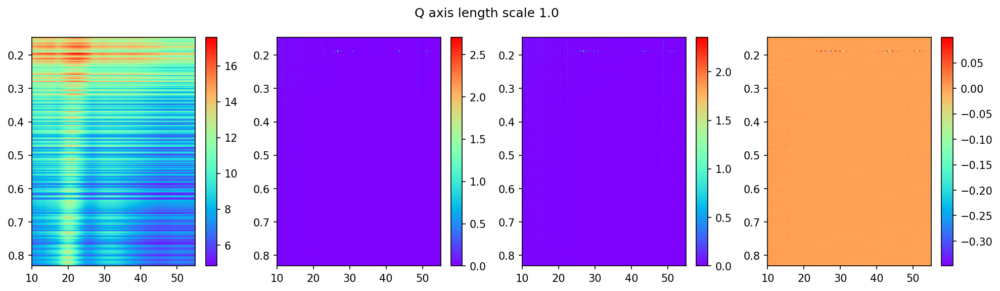

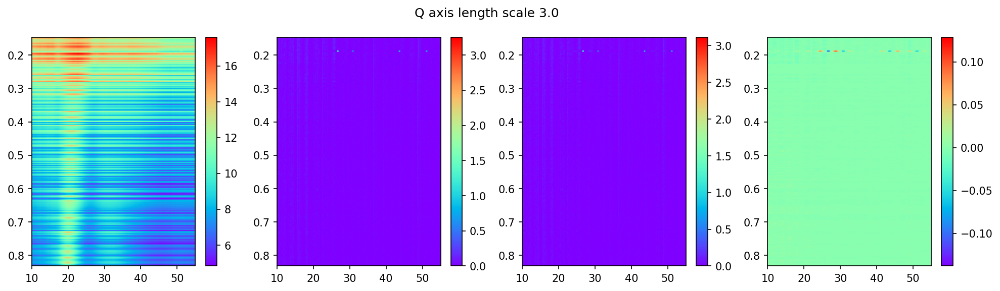

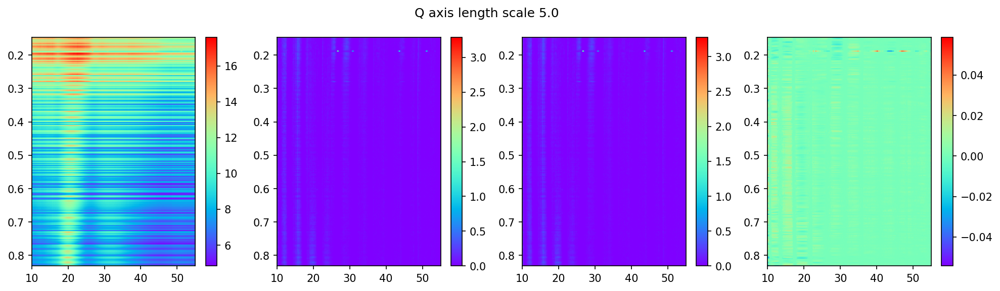

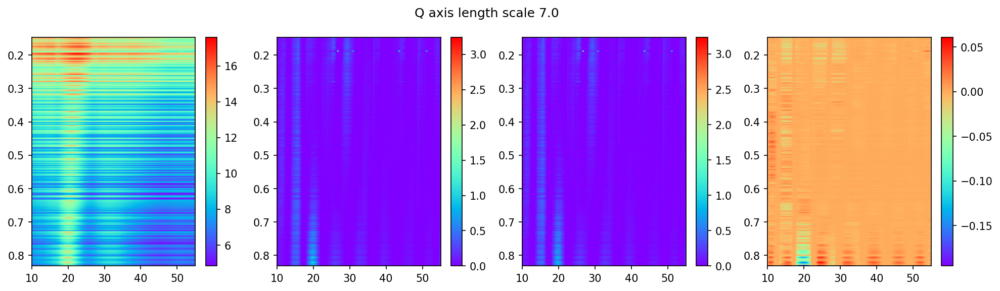

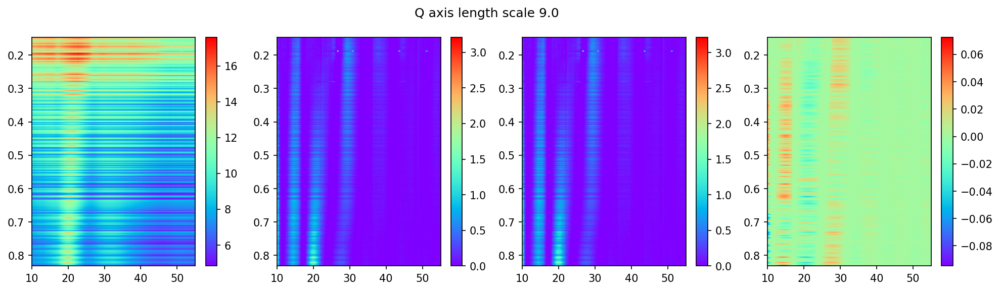

...

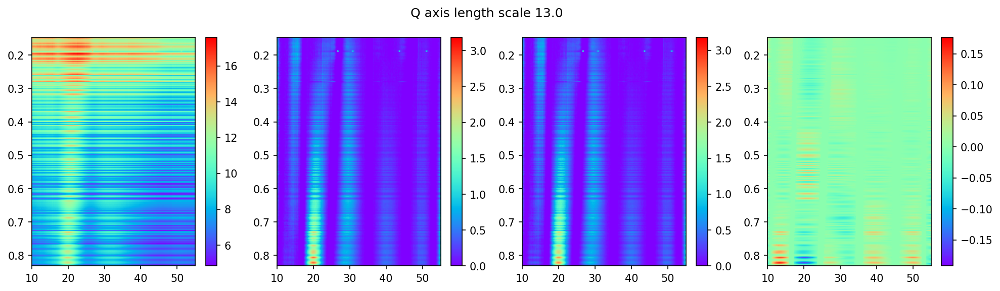

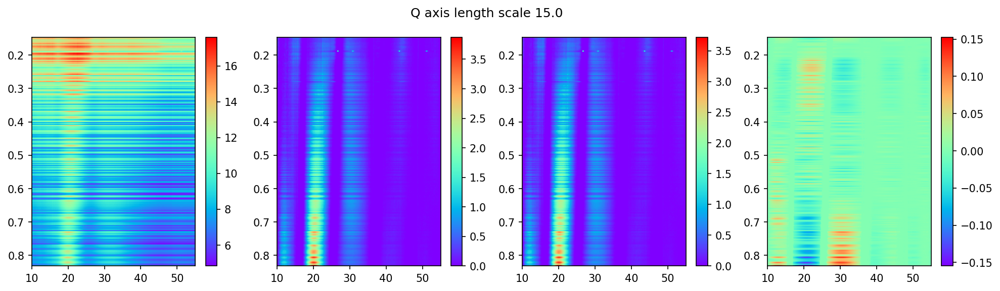

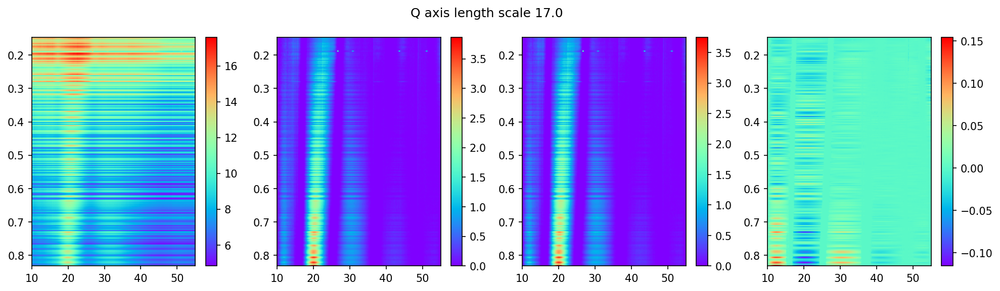

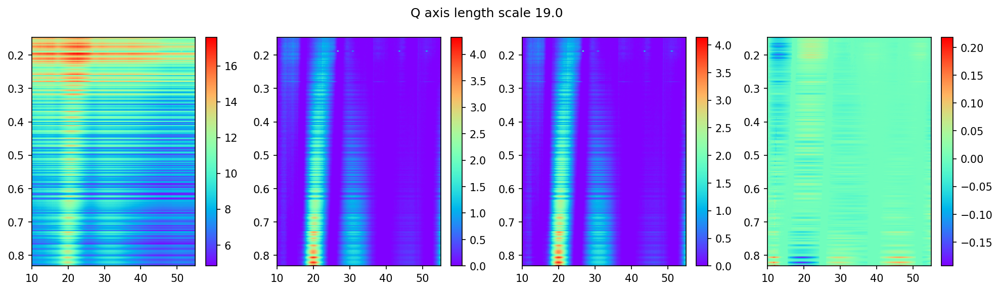

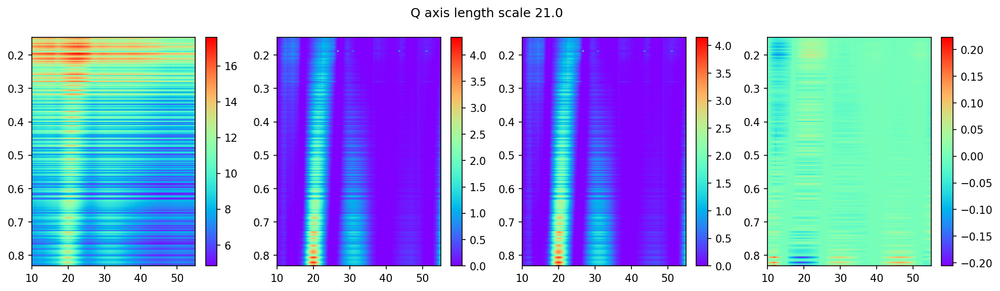

In [58]:
s_allAD = np.vstack(compsort[:,1])
Y = s_allAD
X = Qoverall.astype('float64')
for l_1 in np.linspace(1.,21.,11):
#     l_1 = 5.                                          # in units of X
    l_2 = 10*np.arange(Y.shape[0],dtype='float64')    # in units of Y (n dim)
    nIter = 15.
    bkg2D = mcbl(Y.T, X, l_1, l_2, nIter)
    onedmcbl = np.zeros(s_allAD.shape)
    for i, s in enumerate(s_allAD):
        onedmcbl[i,:] = mcbl(s, Qoverall, l_1)

    s_LaFracs = compsort[:,0]

    fig,ax = plt.subplots(1,4,dpi=150,figsize=(16,4))
    fig.suptitle(f"Q axis length scale {l_1}")
    amorph_all_plot = ax[0].imshow(s_allAD,aspect='auto',cmap='rainbow',
               extent=[min(Qoverall),max(Qoverall),max(La_frac_all),min(La_frac_all)])
    cb0 = plt.colorbar(ax=ax[0],mappable=amorph_all_plot)

    bkgd_subt_plot_1D = ax[1].imshow(s_allAD-onedmcbl,aspect='auto',cmap='rainbow',
               extent=[min(Qoverall),max(Qoverall),max(La_frac_all),min(La_frac_all)])
    cb1 = plt.colorbar(ax=ax[1],mappable=bkgd_subt_plot_1D)

    bkgd_subt_plot_2D = ax[2].imshow(s_allAD-bkg2D.T,aspect='auto',cmap='rainbow',
               extent=[min(Qoverall),max(Qoverall),max(La_frac_all),min(La_frac_all)])
    cb1 = plt.colorbar(ax=ax[2],mappable=bkgd_subt_plot_2D)

    diff_bkg = ax[3].imshow(onedmcbl-bkg2D.T,aspect='auto',cmap='rainbow',
               extent=[min(Qoverall),max(Qoverall),max(La_frac_all),min(La_frac_all)])
    cb2 = plt.colorbar(ax=ax[3],mappable=diff_bkg)
    
    plt.show()
    plt.close()

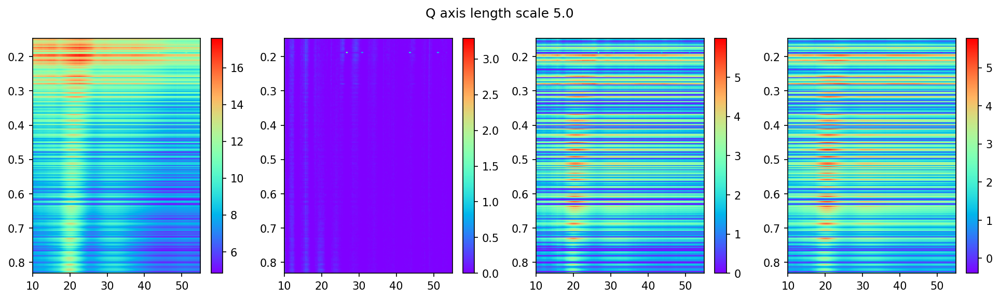

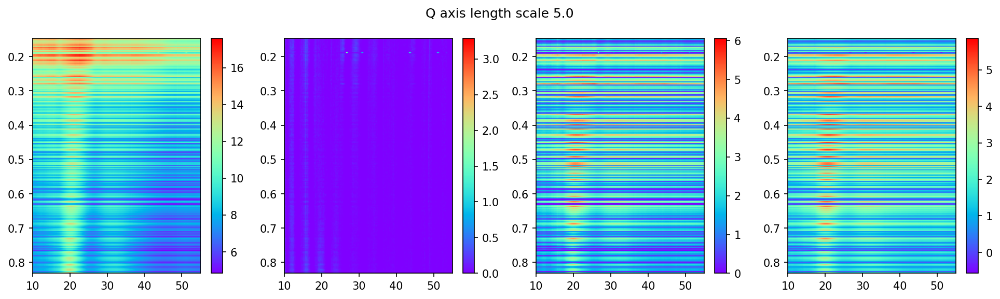

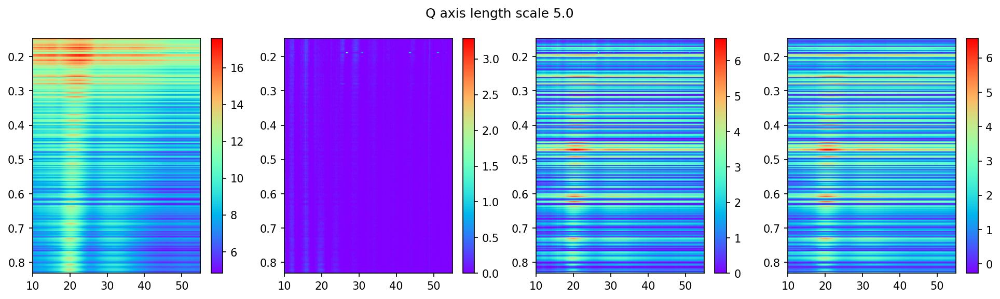

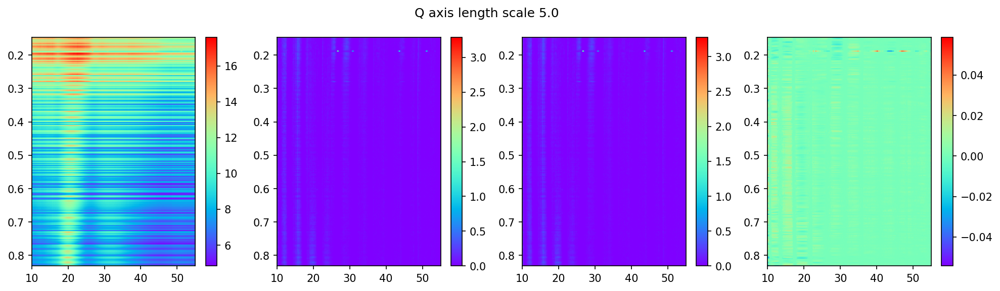

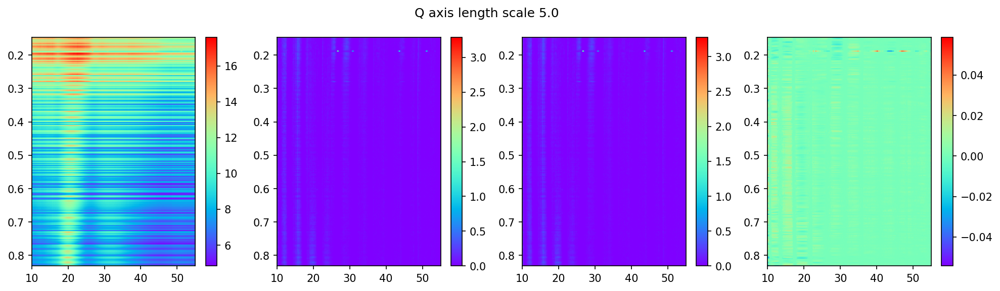

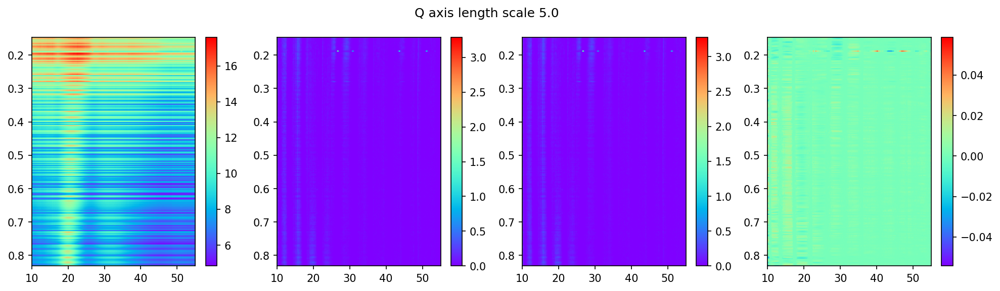

In [61]:
l_2s = [i*np.arange(Y.shape[0],dtype='float64') for i in np.logspace(-2,3,6)]
for l_2 in l_2s:
    l_1 = 5.                                          # in units of X
#     l_2 = 10*np.arange(Y.shape[0],dtype='float64')    # in units of Y (n dim)
    nIter = 15.
    bkg2D = mcbl(Y.T, X, l_1, l_2, nIter)
    onedmcbl = np.zeros(s_allAD.shape)
    for i, s in enumerate(s_allAD):
        onedmcbl[i,:] = mcbl(s, Qoverall, l_1)

    s_LaFracs = compsort[:,0]

    fig,ax = plt.subplots(1,4,dpi=150,figsize=(16,4))
    fig.suptitle(f"Q axis length scale {l_1}")
    amorph_all_plot = ax[0].imshow(s_allAD,aspect='auto',cmap='rainbow',
               extent=[min(Qoverall),max(Qoverall),max(La_frac_all),min(La_frac_all)])
    cb0 = plt.colorbar(ax=ax[0],mappable=amorph_all_plot)

    bkgd_subt_plot_1D = ax[1].imshow(s_allAD-onedmcbl,aspect='auto',cmap='rainbow',
               extent=[min(Qoverall),max(Qoverall),max(La_frac_all),min(La_frac_all)])
    cb1 = plt.colorbar(ax=ax[1],mappable=bkgd_subt_plot_1D)

    bkgd_subt_plot_2D = ax[2].imshow(s_allAD-bkg2D.T,aspect='auto',cmap='rainbow',
               extent=[min(Qoverall),max(Qoverall),max(La_frac_all),min(La_frac_all)])
    cb1 = plt.colorbar(ax=ax[2],mappable=bkgd_subt_plot_2D)

    diff_bkg = ax[3].imshow(onedmcbl-bkg2D.T,aspect='auto',cmap='rainbow',
               extent=[min(Qoverall),max(Qoverall),max(La_frac_all),min(La_frac_all)])
    cb2 = plt.colorbar(ax=ax[3],mappable=diff_bkg)
    
    plt.show()
    plt.close()

actual 3D

In [118]:
keys,La_fracs = compsort(h5data,0)
taus_all= []
Tmaxs_all =[]
Qs_all = []
l_ys_all = []
#3D data
data = []

### get the min, max Q for the entire range
qmins = []
qmaxs = []
for key in keys:
    Q = np.array(h5data[key]['0']['integrated_1d'][0])
    qmins.append(min(Q))
    qmaxs.append(max(Q))
    
maxminQ = max(qmins)
minmaxQ = min(qmaxs)
Qoverall = np.linspace(maxminQ,minmaxQ,1024)
for key in keys:
    print(key)
    tau = float(key.split('_')[1])
    Tmax = float(key.split('_')[3])

    xmap = []
    Q = np.array(h5data[key]['0']['integrated_1d'][0])
    for i in sorted(list(h5data[key]),key=int):
        y = h5data[key][i]['integrated_1d'][1]
        f_x = interp1d(Q,y)
        xmap.append(f_x(Qoverall))
    xmap = np.array(xmap).T
    
    sig = np.average(xmap[100:350,:],axis=0)

    ### trying to be smart about the l_y value... it should change, not necessarily linearly 
    ### but as the signal changes 

    sig2 = uniform_filter1d(sig,).astype('float64')
    sig2 = sig2-min(sig2)
    sig2 = sig2/max(sig2)
    l_y = sig2*10 #+10*np.ones(len(sig2))
    # l_2 = abs(np.gradient(sig2))*100 + 10*np.ones(len(sig2)) #+ abs(max(np.gradient(sig2)))*1e3
    l_ys_all.append(l_y)
    taus_all.append(tau)
    Tmaxs_all.append(Tmax)
    data.append(xmap)
data_array = np.array(data)
l_ys_all = np.array(l_ys_all)

using cation La
tau_6027_T_1139
tau_576_T_1388
tau_984_T_1123
tau_250_T_1144
tau_2364_T_1187
tau_1377_T_685
tau_2384_T_905
tau_3878_T_1322
tau_3866_T_644
tau_701_T_833
tau_1234_T_912
tau_1331_T_1347
tau_487_T_995
tau_274_T_897
tau_9703_T_833
tau_2069_T_689
tau_546_T_614
tau_600_T_1103
tau_6634_T_728
tau_343_T_1255
tau_9955_T_1129
tau_252_T_1021
tau_9976_T_953
tau_266_T_657
tau_1167_T_685
tau_1472_T_1399
tau_507_T_1124
tau_869_T_1106
tau_4540_T_929
tau_250_T_1228
tau_250_T_799
tau_1365_T_1126
tau_6687_T_723
tau_1048_T_909
tau_651_T_752
tau_6128_T_1175
tau_2021_T_667
tau_4207_T_602
tau_439_T_910
tau_250_T_995
tau_853_T_1315
tau_4065_T_1395
tau_820_T_600
tau_9999_T_1277
tau_3326_T_1129
tau_1983_T_907
tau_2474_T_1265
tau_433_T_1120
tau_9999_T_1158
tau_250_T_843
tau_386_T_605
tau_5661_T_1278
tau_5469_T_679
tau_250_T_665
tau_9999_T_909
tau_698_T_991
tau_850_T_1397
tau_2273_T_1377
tau_294_T_1178
tau_1539_T_1208
tau_666_T_1200
tau_9998_T_627
tau_1191_T_978
tau_6558_T_1050
tau_471_T_1399
tau_28

(224, 201)